In [1085]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report,confusion_matrix

import seaborn as sns
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

from sklearn import tree

## 7.1 Data Preparation

#### (a) GetData

In [1086]:
# Read and Select Data

df = pd.read_csv('Coffee-modified.csv')
df = df[['Total.Cup.Points', 'Species','Country.of.Origin','Processing.Method', 'Aroma', 'Flavor', 'Aftertaste',
'Acidity','Body', 'Balance', 'Uniformity', 'Moisture', 'altitude_mean_meters']]

In [1087]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1311 entries, 0 to 1310
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Total.Cup.Points      1311 non-null   float64
 1   Species               1311 non-null   object 
 2   Country.of.Origin     1310 non-null   object 
 3   Processing.Method     1159 non-null   object 
 4   Aroma                 1311 non-null   float64
 5   Flavor                1311 non-null   float64
 6   Aftertaste            1311 non-null   float64
 7   Acidity               1311 non-null   float64
 8   Body                  1311 non-null   float64
 9   Balance               1311 non-null   float64
 10  Uniformity            1311 non-null   float64
 11  Moisture              1311 non-null   float64
 12  altitude_mean_meters  1082 non-null   float64
dtypes: float64(10), object(3)
memory usage: 133.3+ KB


In [1088]:
df.dropna(inplace=True)

In [1089]:
df.describe()

,Total.Cup.Points,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters
count,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000
mean,82.126949,7.567488,7.513779,7.385633,7.526221,7.504287,7.499302,9.870219,0.094985,1816.792017
std,2.631610,0.301361,0.324487,0.332735,0.307827,0.272824,0.340801,0.445371,0.043468,9112.472930
min,59.830000,5.080000,6.170000,6.170000,5.250000,6.330000,6.080000,6.000000,0.000000,1.000000
25%,81.170000,7.420000,7.330000,7.170000,7.330000,7.330000,7.330000,10.000000,0.100000,1100.000000
50%,82.420000,7.580000,7.500000,7.420000,7.500000,7.500000,7.500000,10.000000,0.110000,1310.640000
75%,83.580000,7.750000,7.670000,7.580000,7.670000,7.670000,7.670000,10.000000,0.120000,1600.000000
max,90.580000,8.750000,8.830000,8.670000,8.750000,8.500000,8.580000,10.000000,0.170000,190164.000000


In [1090]:
df.reset_index(inplace=True)
df.drop(columns=['index'], inplace=True)

In [1091]:
# Assign X, Y
Y = df.iloc[:, 0:1] 
X = df.iloc[:, 1:]

In [1092]:
# X

In [1093]:
Y

,Total.Cup.Points
0,90.58
1,89.92
2,89.00
3,88.83
4,88.25
...,...
998,69.17
999,68.33
1000,67.92
1001,63.08


#### (b) Data Preparaition (Prepare Y)

In [1094]:
rating_pctile = np.percentile(Y, [75, 90])
Bean_grade = []
NSamples = [0] * 3

for value in Y['Total.Cup.Points']:
  if value < rating_pctile[0]:   # 75 percentile
    grade = 1
  elif value < rating_pctile[1]: # 90 percentile
    grade = 2
  else:
    grade = 3

  Bean_grade.append(grade)      # append grade
  NSamples[grade - 1] += 1      # Count each grade

In [1095]:
fig = px.bar(x = [1,2,3], y = NSamples, color=NSamples, range_y=[0.0,1000])
fig.show()

In [1096]:
Y["Bean_grade"] = Bean_grade
Y.drop(["Total.Cup.Points"],axis =1,inplace= True)

#### (C) Data preparation (Prepare X)

In [1097]:
# Split X by object types or number types
# object types => one hot
# number types => corelation and drop 

numerical_feature = X.select_dtypes("number")
categorical_features = X.select_dtypes("object")

In [1098]:
# categorical_features
# numerical_feature

In [1099]:
standard_scaler = preprocessing.StandardScaler()
numerical_feature = pd.DataFrame(standard_scaler.fit_transform(numerical_feature), columns=numerical_feature.columns)
# numerical_feature

<AxesSubplot:>

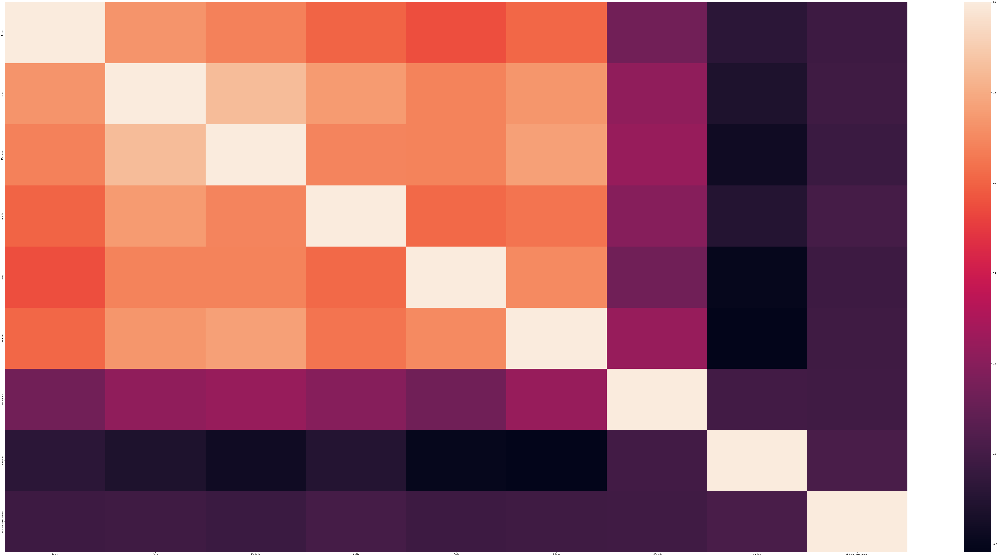

In [1100]:
sns.heatmap(numerical_feature.corr())

In [1101]:
lower = pd.DataFrame(np.tril(numerical_feature.corr(), -1), columns=numerical_feature.corr().columns)
# lower

<AxesSubplot:>

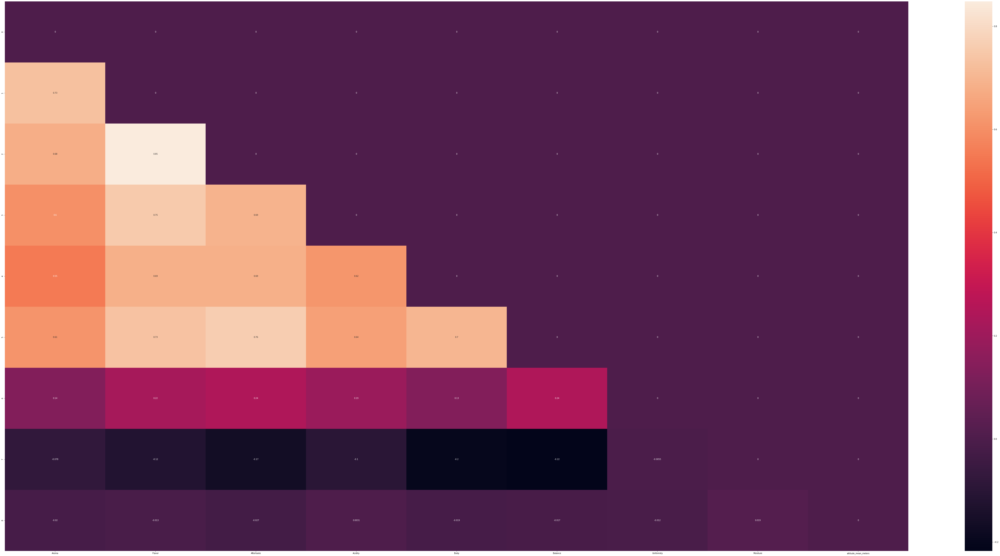

In [1102]:
sns.heatmap(lower, annot=True)

In [1103]:
to_drop = [column for column in lower if any(lower[column] > 0.8)]
# to_drop

In [1104]:
numerical_feature.drop(to_drop, inplace=True, axis=1)
numerical_feature

,Aroma,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters
0,3.660274,3.861950,3.977528,3.651469,2.702919,0.291544,0.575762,0.028350
1,3.925869,3.350779,3.424993,3.358094,2.702919,0.291544,0.575762,0.028350
2,2.000305,3.110228,2.904961,3.651469,2.203845,0.291544,0.345595,0.020115
3,2.265900,2.599057,3.164977,3.358094,2.438704,0.291544,0.575762,0.028350
4,1.701510,3.350779,3.164977,0.607701,2.702919,0.291544,0.115428,0.000627
...,...,...,...,...,...,...,...,...
998,-1.884024,-3.655275,-3.335427,-3.059490,-3.902470,-4.201335,0.115428,-0.040272
999,-1.618429,-3.414724,-0.345241,-0.932520,-2.199748,0.291544,0.345595,-0.100659
1000,-2.714009,-2.903553,-2.782892,-1.555942,-2.434606,-1.213570,1.036097,-0.161046
1001,-1.054039,-3.174173,-4.147977,-3.976288,-4.166686,-8.694214,0.805930,-0.078700


In [1105]:
categorical_features = pd.get_dummies(categorical_features, drop_first=True )
categorical_features

,Country.of.Origin_Burundi,Country.of.Origin_China,Country.of.Origin_Colombia,Country.of.Origin_Costa Rica,Country.of.Origin_Cote d?Ivoire,Country.of.Origin_Ecuador,Country.of.Origin_El Salvador,Country.of.Origin_Ethiopia,Country.of.Origin_Guatemala,Country.of.Origin_Haiti,...,Country.of.Origin_Thailand,Country.of.Origin_Uganda,Country.of.Origin_United States,Country.of.Origin_United States (Puerto Rico),Country.of.Origin_Vietnam,Country.of.Origin_Zambia,Processing.Method_Other,Processing.Method_Pulped natural / honey,Processing.Method_Semi-washed / Semi-pulped,Processing.Method_Washed / Wet
0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
999,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1000,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1001,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [1106]:
X = numerical_feature.join(categorical_features)
X

,Aroma,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters,Country.of.Origin_Burundi,Country.of.Origin_China,...,Country.of.Origin_Thailand,Country.of.Origin_Uganda,Country.of.Origin_United States,Country.of.Origin_United States (Puerto Rico),Country.of.Origin_Vietnam,Country.of.Origin_Zambia,Processing.Method_Other,Processing.Method_Pulped natural / honey,Processing.Method_Semi-washed / Semi-pulped,Processing.Method_Washed / Wet
0,3.660274,3.861950,3.977528,3.651469,2.702919,0.291544,0.575762,0.028350,0,0,...,0,0,0,0,0,0,0,0,0,1
1,3.925869,3.350779,3.424993,3.358094,2.702919,0.291544,0.575762,0.028350,0,0,...,0,0,0,0,0,0,0,0,0,1
2,2.000305,3.110228,2.904961,3.651469,2.203845,0.291544,0.345595,0.020115,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2.265900,2.599057,3.164977,3.358094,2.438704,0.291544,0.575762,0.028350,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1.701510,3.350779,3.164977,0.607701,2.702919,0.291544,0.115428,0.000627,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998,-1.884024,-3.655275,-3.335427,-3.059490,-3.902470,-4.201335,0.115428,-0.040272,0,0,...,0,0,0,0,0,0,0,0,0,1
999,-1.618429,-3.414724,-0.345241,-0.932520,-2.199748,0.291544,0.345595,-0.100659,0,0,...,0,0,0,0,0,0,0,0,0,1
1000,-2.714009,-2.903553,-2.782892,-1.555942,-2.434606,-1.213570,1.036097,-0.161046,0,0,...,0,0,0,0,0,0,0,0,0,0
1001,-1.054039,-3.174173,-4.147977,-3.976288,-4.166686,-8.694214,0.805930,-0.078700,0,0,...,0,0,0,0,0,0,1,0,0,0


In [1107]:
seed = 50
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=seed)

## 7.2 Model Preparation

In [1108]:
X

,Aroma,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters,Country.of.Origin_Burundi,Country.of.Origin_China,...,Country.of.Origin_Thailand,Country.of.Origin_Uganda,Country.of.Origin_United States,Country.of.Origin_United States (Puerto Rico),Country.of.Origin_Vietnam,Country.of.Origin_Zambia,Processing.Method_Other,Processing.Method_Pulped natural / honey,Processing.Method_Semi-washed / Semi-pulped,Processing.Method_Washed / Wet
0,3.660274,3.861950,3.977528,3.651469,2.702919,0.291544,0.575762,0.028350,0,0,...,0,0,0,0,0,0,0,0,0,1
1,3.925869,3.350779,3.424993,3.358094,2.702919,0.291544,0.575762,0.028350,0,0,...,0,0,0,0,0,0,0,0,0,1
2,2.000305,3.110228,2.904961,3.651469,2.203845,0.291544,0.345595,0.020115,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2.265900,2.599057,3.164977,3.358094,2.438704,0.291544,0.575762,0.028350,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1.701510,3.350779,3.164977,0.607701,2.702919,0.291544,0.115428,0.000627,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998,-1.884024,-3.655275,-3.335427,-3.059490,-3.902470,-4.201335,0.115428,-0.040272,0,0,...,0,0,0,0,0,0,0,0,0,1
999,-1.618429,-3.414724,-0.345241,-0.932520,-2.199748,0.291544,0.345595,-0.100659,0,0,...,0,0,0,0,0,0,0,0,0,1
1000,-2.714009,-2.903553,-2.782892,-1.555942,-2.434606,-1.213570,1.036097,-0.161046,0,0,...,0,0,0,0,0,0,0,0,0,0
1001,-1.054039,-3.174173,-4.147977,-3.976288,-4.166686,-8.694214,0.805930,-0.078700,0,0,...,0,0,0,0,0,0,1,0,0,0


In [1109]:
Y

,Bean_grade
0,3
1,3
2,3
3,3
4,3
...,...
998,1
999,1
1000,1
1001,1


#### (a) KNN Model Training and Testing

In [1110]:
k = [1,3,5,7,9,11,13,19,25,35]

In [1111]:
KNN_scores = []
for neighbor in k:
  # Model Training
  modelKNN = KNeighborsClassifier(n_neighbors=neighbor,p=2)
  modelKNN.fit(x_train,y_train)

  # Model Testing
  y_pred = modelKNN.predict(x_test)
  KNNScore = accuracy_score(y_test, y_pred)

  KNN_scores.append(KNNScore)

fig = px.bar(KNN_scores,x=k,y=KNN_scores,color=KNN_scores,range_y=[0.7,1.0])
fig.show()  

In [1112]:
# Fron Graph -> k = 5 is a max KNN_score

# Model Training
modelKNN = KNeighborsClassifier(n_neighbors=5,p=2)
modelKNN.fit(x_train,y_train)

# Model Testing
y_pred = modelKNN.predict(x_test)
KNNScore = accuracy_score(y_test, y_pred)

print('KNN SCORE: ', KNNScore)

print('Confusion Matrix: ')
print(confusion_matrix(y_test, y_pred))
print('Classification Report: ')
print(classification_report(y_test, y_pred))

KNN SCORE:  0.9136212624584718
Confusion Matrix: 
[[227   7   0]
 [  9  25   3]
 [  0   7  23]]
Classification Report: 
              precision    recall  f1-score   support

           1       0.96      0.97      0.97       234
           2       0.64      0.68      0.66        37
           3       0.88      0.77      0.82        30

    accuracy                           0.91       301
   macro avg       0.83      0.80      0.82       301
weighted avg       0.91      0.91      0.91       301



#### (b) Decision Tree Model Training and Testing

In [1113]:
# Decision tree parameter

ASM_function = ['entropy', 'gini']
maxD = [4, 5, 6, None]

In [1114]:
# For Backup max_DTScore
# max_DTScore = 0

for asm in ASM_function:
  for depth in maxD:
    # Model Training
    ModelDT = DecisionTreeClassifier(criterion=asm,splitter='best',max_depth=depth)
    ModelDT.fit(x_train,y_train)

    # Model testing 
    y_pred = ModelDT.predict(x_test)
    DTScore = accuracy_score(y_test,y_pred)
    
    print("DTScore:", DTScore, "ASM:", asm, "Depth", depth)

DTScore: 0.8604651162790697 ASM: entropy Depth 4
DTScore: 0.8637873754152824 ASM: entropy Depth 5
DTScore: 0.8704318936877077 ASM: entropy Depth 6
DTScore: 0.8870431893687708 ASM: entropy Depth None
DTScore: 0.8637873754152824 ASM: gini Depth 4
DTScore: 0.867109634551495 ASM: gini Depth 5
DTScore: 0.8803986710963455 ASM: gini Depth 6
DTScore: 0.9003322259136213 ASM: gini Depth None


In [1115]:
# Print Confusion Matrix and Classification Report for best k
# Best k -> ASM: gini Depth None

# Model Training
ModelDT = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=None)
ModelDT.fit(x_train,y_train)

# Model testing 
y_pred = ModelDT.predict(x_test)
DTScore = accuracy_score(y_test,y_pred)

print('Confusion Matrix: ')
print(confusion_matrix(y_test,y_pred))
print('Classifiction Report: ')
print(classification_report(y_test,y_pred))

Confusion Matrix: 
[[223  11   0]
 [ 13  20   4]
 [  1   6  23]]
Classifiction Report: 
              precision    recall  f1-score   support

           1       0.94      0.95      0.95       234
           2       0.54      0.54      0.54        37
           3       0.85      0.77      0.81        30

    accuracy                           0.88       301
   macro avg       0.78      0.75      0.76       301
weighted avg       0.88      0.88      0.88       301



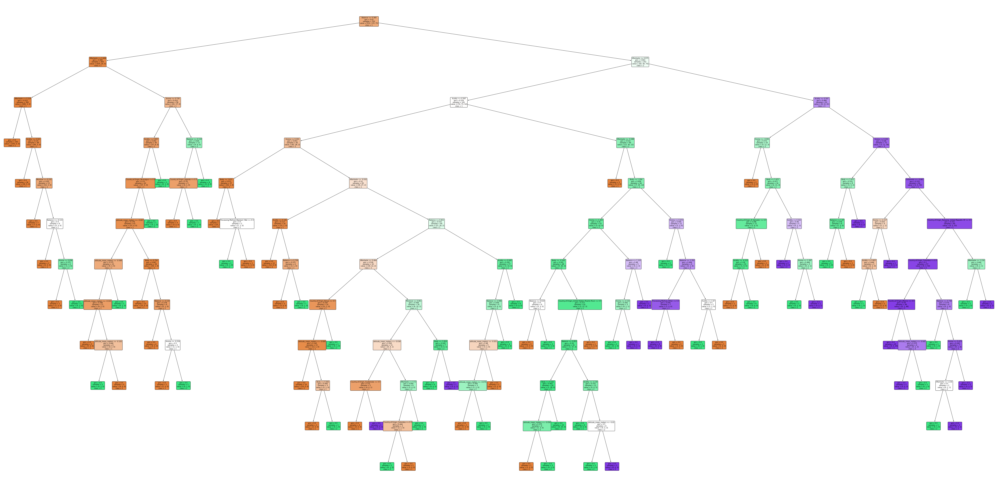

In [1116]:
# Visualize decision tree

feature_names = x_train.columns
Labels = [str(temp) for temp in np.unique(y_train)]
tree.plot_tree( ModelDT,
            feature_names = feature_names,
            class_names = Labels,
            rounded = True,
            filled = True, fontsize=9)

plt.show()

#### (C) Random Forest Model Training and Testing

In [1117]:
# Random Forest parameter

ASM_function = ['entropy','gini']
nEstimator = 100 
nJob = 8
rState =10

In [1118]:
RF_scores = []
for asm in ASM_function:    
    # Model Training 
    RandomF = RandomForestClassifier(criterion=asm,n_estimators=nEstimator,n_jobs=nJob,random_state=rState)
    RandomF.fit(x_train,y_train)    

    # Model Testing
    y_pred = RandomF.predict(x_test)
    RFScore = accuracy_score(y_test,y_pred.ravel())
    
    RF_scores.append(RFScore)
    print(RFScore)

0.9003322259136213
0.8970099667774086


In [1119]:
# Print confusion matrix and classification report for best k

# Model Training 
RandomF = RandomForestClassifier(criterion='entropy',n_estimators=nEstimator,n_jobs=nJob,random_state=rState)
RandomF.fit(x_train,y_train)    

# Model Testing
y_pred = RandomF.predict(x_test)
RFScore = accuracy_score(y_test,y_pred.ravel())

print('Confusion Matrix: ')
print(confusion_matrix(y_test,y_pred))
print('Classification Report: ')
print(classification_report(y_test,y_pred))

Confusion Matrix: 
[[228   6   0]
 [ 11  21   5]
 [  0   8  22]]
Classification Report: 
              precision    recall  f1-score   support

           1       0.95      0.97      0.96       234
           2       0.60      0.57      0.58        37
           3       0.81      0.73      0.77        30

    accuracy                           0.90       301
   macro avg       0.79      0.76      0.77       301
weighted avg       0.90      0.90      0.90       301



<AxesSubplot:>

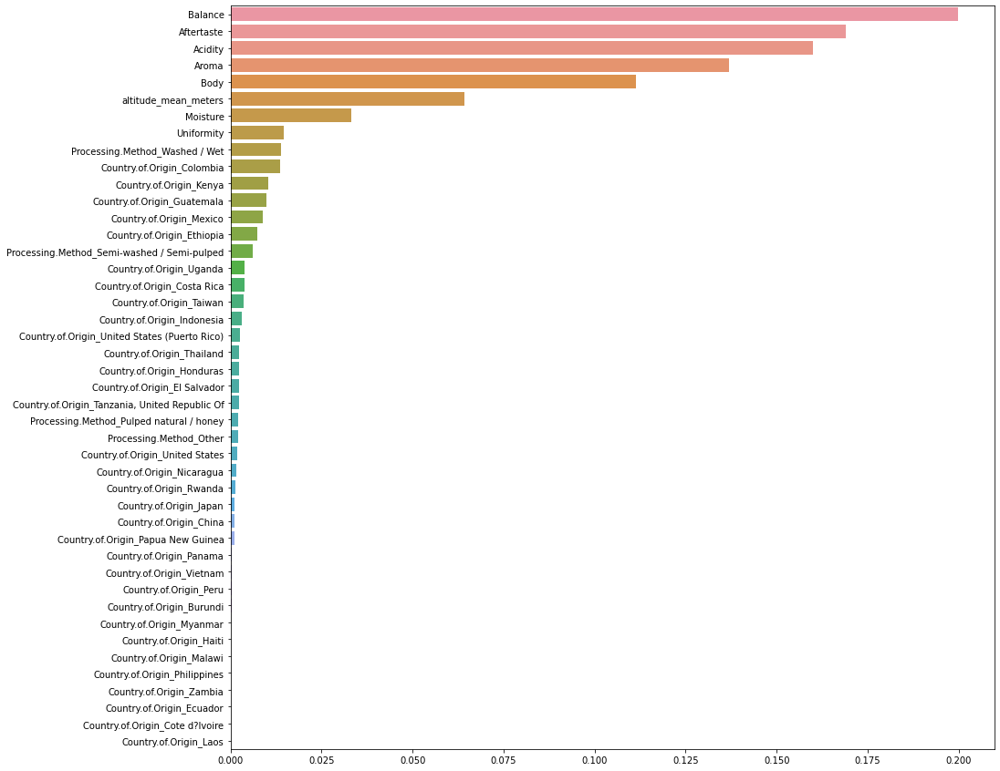

In [1120]:
# Visualize Feature Important Score
feature_imp = pd.Series(RandomF.feature_importances_,index = feature_names).sort_values(ascending=False)

# Creating a bar plot
plt.figure(figsize=(15,15))
sns.barplot(x=feature_imp,y=feature_imp.index)

In [1121]:
# Visualize selected estimator [0-5] tree structure of Random forest

fig,axes = plt.subplots(nrows=1 , ncols=5, figsize=(100,20), dpi=500)
for index in range(0,5):
    tree.plot_tree(RandomF.estimators_[index],class_names=Labels,filled = True,ax = axes[index])
axes[index].set_title('Estimator:'+str(index),fontsize=11)

Text(0.5, 1.0, 'Estimator:4')

## 7.3 Hyperparameter Tuning

#### (a) Hyperparameter Tuning (GridsearchCV)

In [1122]:
# Create Model List

classification = {'KNN':KNeighborsClassifier(),'DT':DecisionTreeClassifier(),'RF':RandomForestClassifier() }

In [1123]:
# Create Parameter Dictionary for KNN

K_list = [1,3,5,7,9,11,13,15,17,19,21,23,35,45]
KNN_param = dict(n_neighbors = K_list)

In [1124]:
# Create Parameter Dictionary for Decision Tree

ASM_function = ['entropy','gini']
maxD = [4,5,6,None]
maxF =['auto','log2',None]
minSample = [1,2,4]
DT_param = dict(criterion = ASM_function,max_depth = maxD,min_samples_leaf = minSample,max_features = maxF)

In [1125]:
# Create Parameter Dictionary for Random Forest

nEst = [10,30,50,100]
RF_param = dict(n_estimators = nEst,criterion = ASM_function,max_depth = maxD,min_samples_leaf= minSample,max_features = maxF)
DecisionTreeClassifier().get_params().keys()

dict_keys(['ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'random_state', 'splitter'])

#### (b) Hyperparameter Tuning (GridsearchCV)

In [1126]:
# Perform GridsearchCV() for each classification model

for model in classification:
  if model == 'KNN':
    param = KNN_param
  elif model == 'DT':
    param = DT_param
  else:
    param = RF_param

  model = classification[model]
  grid = GridSearchCV(estimator=model, n_jobs=8, verbose=10, scoring='accuracy', cv=2, param_grid=param)

  grid_result = grid.fit(x_train, y_train)

Fitting 2 folds for each of 14 candidates, totalling 28 fits
[CV 2/2; 2/14] START n_neighbors=3..............................................
[CV 2/2; 1/14] START n_neighbors=1..............................................
[CV 2/2; 3/14] START n_neighbors=5..............................................
[CV 1/2; 3/14] START n_neighbors=5..............................................
[CV 1/2; 1/14] START n_neighbors=1..............................................
[CV 1/2; 2/14] START n_neighbors=3..............................................
[CV 1/2; 1/14] END ...............n_neighbors=1;, score=0.846 total time=   0.0s
[CV 1/2; 3/14] END ...............n_neighbors=5;, score=0.869 total time=   0.0s
[CV 2/2; 1/14] END ...............n_neighbors=1;, score=0.823 total time=   0.0s
[CV 2/2; 2/14] END ...............n_neighbors=3;, score=0.846 total time=   0.1s
[CV 2/2; 3/14] END ...............n_neighbors=5;, score=0.863 total time=   0.0s
[CV 1/2; 5/14] START n_neighbors=9..............

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:207: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:207: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:207: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighb

[CV 2/2; 23/72] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2;, score=0.746 total time=   0.0s
[CV 1/2; 24/72] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4;, score=0.783 total time=   0.0s
[CV 2/2; 24/72] START criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4
[CV 1/2; 25/72] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1;, score=0.846 total time=   0.0s
[CV 2/2; 25/72] START criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1
[CV 2/2; 24/72] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4;, score=0.786 total time=   0.0s
[CV 2/2; 25/72] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1;, score=0.860 total time=   0.0s
[CV 1/2; 26/72] START criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2
[CV 1/2; 29/72] START criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=2
[CV 1/2; 27/72

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'

[CV 1/2; 8/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, n_estimators=100;, score=0.835 total time=   0.1s
[CV 1/2; 16/288] START criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, n_estimators=100
[CV 1/2; 14/288] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, n_estimators=30;, score=0.821 total time=   0.0s
[CV 2/2; 14/288] START criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, n_estimators=30
[CV 1/2; 17/288] START criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, n_estimators=10
[CV 1/2; 18/288] START criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, n_estimators=30
[CV 2/2; 11/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, n_estimators=50;, score=0.852 total time=   0.0s
[CV 1/2; 19/288] START criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, n_estimators=50
[CV 1/2; 17/288] END crite

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 2/2; 20/288] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, n_estimators=100;, score=0.838 total time=   0.1s
[CV 2/2; 37/288] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, n_estimators=10;, score=0.829 total time=   0.0s
[CV 1/2; 38/288] START criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, n_estimators=30
[CV 2/2; 27/288] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, n_estimators=50;, score=0.866 total time=   0.1s
[CV 1/2; 28/288] START criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, n_estimators=100
[CV 1/2; 38/288] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.860 total time=   0.0s
[CV 2/2; 38/288] START criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, n_estimators=30
[CV 1/2; 39/288] START criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, n_estimato

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  es

[CV 1/2; 28/288] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, n_estimators=100;, score=0.880 total time=   0.2s
[CV 2/2; 28/288] START criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, n_estimators=100
[CV 2/2; 49/288] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=10;, score=0.835 total time=   0.0s
[CV 1/2; 50/288] START criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=30
[CV 1/2; 51/288] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50;, score=0.835 total time=   0.0s
[CV 2/2; 51/288] START criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50
[CV 1/2; 50/288] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=30;, score=0.838 total time=   0.0s
[CV 2/2; 50/288] START criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimato

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 2/2; 58/288] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=30;, score=0.835 total time=   0.0s
[CV 1/2; 59/288] START criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=50
[CV 1/2; 62/288] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=30;, score=0.886 total time=   0.0s
[CV 2/2; 62/288] START criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=30
[CV 1/2; 66/288] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=30;, score=0.883 total time=   0.0s
[CV 2/2; 66/288] START criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=30
[CV 2/2; 55/288] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=50;, score=0.858 total time=   0.1s
[CV 1/2; 56/288] START criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 82/288] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=30;, score=0.852 total time=   0.0s
[CV 2/2; 82/288] START criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=30
[CV 1/2; 56/288] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=100;, score=0.832 total time=   0.1s
[CV 2/2; 56/288] START criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=100
[CV 1/2; 63/288] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=50;, score=0.877 total time=   0.1s
[CV 2/2; 63/288] START criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=50
[CV 1/2; 79/288] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, n_estimators=50;, score=0.877 total time=   0.1s
[CV 2/2; 79/288] START criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, n_estimato

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 97/288] START criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=10
[CV 2/2; 86/288] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=30;, score=0.849 total time=   0.1s
[CV 1/2; 87/288] START criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=50
[CV 1/2; 97/288] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=10;, score=0.895 total time=   0.0s
[CV 2/2; 97/288] START criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=10
[CV 1/2; 94/288] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=30;, score=0.832 total time=   0.0s
[CV 2/2; 94/288] START criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=30
[CV 1/2; 90/288] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=30;, score=0.855 total time=   0

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 110/288] END criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.877 total time=   0.0s
[CV 2/2; 110/288] START criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=1, n_estimators=30
[CV 1/2; 96/288] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=100;, score=0.821 total time=   0.1s
[CV 2/2; 96/288] START criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=100
[CV 2/2; 106/288] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=30;, score=0.860 total time=   0.0s
[CV 1/2; 107/288] START criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=50
[CV 2/2; 110/288] END criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.872 total time=   0.0s
[CV 1/2; 111/288] START criterion=entropy, max_depth=None, max_features=auto, min_samples_

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 126/288] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=30;, score=0.849 total time=   0.0s
[CV 2/2; 126/288] START criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=30
[CV 2/2; 118/288] END criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, n_estimators=30;, score=0.863 total time=   0.0s
[CV 1/2; 119/288] START criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, n_estimators=50
[CV 2/2; 122/288] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=1, n_estimators=30;, score=0.869 total time=   0.0s
[CV 1/2; 123/288] START criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=1, n_estimators=50
[CV 1/2; 115/288] END criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=50;, score=0.883 total time=   0.1s
[CV 2/2; 115/288] START criterion=entropy, max_depth=None, max_features=auto, 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestCla

[CV 1/2; 134/288] END criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=30;, score=0.892 total time=   0.0s
[CV 2/2; 134/288] START criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=30
[CV 2/2; 134/288] END criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=30;, score=0.895 total time=   0.0s
[CV 1/2; 135/288] START criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50
[CV 1/2; 116/288] END criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=100;, score=0.869 total time=   0.1s
[CV 2/2; 116/288] START criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=100
[CV 1/2; 130/288] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=30;, score=0.823 total time=   0.1s
[CV 2/2; 130/288] START criterion=entropy, max_depth=None, max_features=log2

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestCla

[CV 1/2; 153/288] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, n_estimators=10;, score=0.835 total time=   0.0s
[CV 2/2; 153/288] START criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, n_estimators=10
[CV 1/2; 157/288] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, n_estimators=10;, score=0.829 total time=   0.0s
[CV 2/2; 157/288] START criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, n_estimators=10
[CV 2/2; 142/288] END criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=4, n_estimators=30;, score=0.886 total time=   0.0s
[CV 1/2; 143/288] START criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=4, n_estimators=50
[CV 1/2; 146/288] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.846 total time=   0.0s
[CV 2/2; 146/288] START criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=30


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  es

[CV 1/2; 148/288] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=100;, score=0.826 total time=   0.1s
[CV 2/2; 148/288] START criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=100
[CV 1/2; 140/288] END criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=2, n_estimators=100;, score=0.889 total time=   0.1s
[CV 2/2; 140/288] START criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=2, n_estimators=100
[CV 2/2; 136/288] END criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=100;, score=0.880 total time=   0.1s
[CV 1/2; 165/288] START criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, n_estimators=10
[CV 1/2; 152/288] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, n_estimators=100;, score=0.843 total time=   0.1s
[CV 2/2; 152/288] START criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, n_es

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 174/288] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, n_estimators=30;, score=0.875 total time=   0.1s
[CV 2/2; 174/288] START criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, n_estimators=30
[CV 2/2; 160/288] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, n_estimators=100;, score=0.829 total time=   0.1s
[CV 2/2; 185/288] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=10;, score=0.826 total time=   0.0s
[CV 1/2; 186/288] START criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=30
[CV 1/2; 171/288] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, n_estimators=50;, score=0.877 total time=   0.0s
[CV 2/2; 171/288] START criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, n_estimators=50
[CV 1/2; 182/288] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.846

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  es

[CV 2/2; 197/288] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.823 total time=   0.0s
[CV 1/2; 198/288] START criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=30
[CV 2/2; 191/288] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, n_estimators=50;, score=0.858 total time=   0.1s
[CV 1/2; 192/288] START criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, n_estimators=100
[CV 1/2; 198/288] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=30;, score=0.835 total time=   0.0s
[CV 2/2; 198/288] START criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=30
[CV 1/2; 195/288] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50;, score=0.852 total time=   0.1s
[CV 2/2; 195/288] START criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50
[CV 2/2; 19

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 205/288] START criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=10
[CV 2/2; 192/288] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, n_estimators=100;, score=0.866 total time=   0.1s
[CV 2/2; 188/288] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=100;, score=0.869 total time=   0.1s
[CV 1/2; 209/288] START criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=10
[CV 2/2; 180/288] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, n_estimators=100;, score=0.875 total time=   0.1s[CV 1/2; 213/288] START criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, n_estimators=10

[CV 1/2; 217/288] START criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=10
[CV 1/2; 205/288] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=10;, score=0.880 total time=   0.0s
[CV 2/2; 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestCla

[CV 1/2; 229/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=10;, score=0.840 total time=   0.0s
[CV 2/2; 229/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=10
[CV 1/2; 219/288] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=50;, score=0.855 total time=   0.1s
[CV 2/2; 219/288] START criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=50
[CV 2/2; 226/288] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=30;, score=0.863 total time=   0.1s
[CV 1/2; 227/288] START criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=50
[CV 1/2; 207/288] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=50;, score=0.877 total time=   0.1s
[CV 2/2; 207/288] START criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=50
[CV 2/2; 229

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  es

[CV 2/2; 204/288] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=100;, score=0.835 total time=   0.2s
[CV 1/2; 233/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=10
[CV 1/2; 231/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=50;, score=0.846 total time=   0.1s
[CV 2/2; 231/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=50
[CV 1/2; 233/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.840 total time=   0.0s
[CV 2/2; 233/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=10
[CV 2/2; 233/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.860 total time=   0.0s
[CV 1/2; 234/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=30
[CV 1/2; 22

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 235/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=50;, score=0.846 total time=   0.1s
[CV 2/2; 235/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=50
[CV 2/2; 220/288] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=100;, score=0.877 total time=   0.2s
[CV 1/2; 237/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=10
[CV 1/2; 237/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.858 total time=   0.0s
[CV 2/2; 237/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=10
[CV 2/2; 224/288] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, n_estimators=100;, score=0.872 total time=   0.2s
[CV 1/2; 232/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=100;, score=0.8

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 2/2; 257/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=10;, score=0.863 total time=   0.0s
[CV 1/2; 258/288] START criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=30
[CV 2/2; 249/288] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=10;, score=0.872 total time=   0.1s
[CV 1/2; 250/288] START criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=30
[CV 1/2; 239/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=50;, score=0.835 total time=   0.1s
[CV 2/2; 239/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, n_estimators=50
[CV 1/2; 236/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=100;, score=0.858 total time=   0.2s
[CV 2/2; 236/288] START criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=100
[CV 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestCla

[CV 1/2; 263/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=4, n_estimators=50;, score=0.840 total time=   0.1s
[CV 2/2; 263/288] START criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=4, n_estimators=50
[CV 1/2; 259/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=50;, score=0.877 total time=   0.1s
[CV 2/2; 259/288] START criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=50
[CV 1/2; 255/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=1, n_estimators=50;, score=0.886 total time=   0.1s
[CV 2/2; 255/288] START criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=1, n_estimators=50
[CV 2/2; 236/288] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=100;, score=0.872 total time=   0.2s
[CV 1/2; 265/288] START criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, n_esti

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  es

[CV 2/2; 266/288] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, n_estimators=30;, score=0.872 total time=   0.1s
[CV 1/2; 267/288] START criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, n_estimators=50
[CV 2/2; 251/288] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=50;, score=0.877 total time=   0.2s
[CV 1/2; 252/288] START criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=100
[CV 1/2; 264/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=4, n_estimators=100;, score=0.843 total time=   0.2s
[CV 2/2; 264/288] START criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=4, n_estimators=100
[CV 1/2; 260/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, n_estimators=100;, score=0.869 total time=   0.3s
[CV 2/2; 260/288] START criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, n_esti

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 2/2; 256/288] END criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=1, n_estimators=100;, score=0.872 total time=   0.1s
[CV 1/2; 277/288] START criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=10
[CV 1/2; 281/288] START criterion=gini, max_depth=None, max_features=None, min_samples_leaf=2, n_estimators=10
[CV 1/2; 271/288] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=50;, score=0.863 total time=   0.0s
[CV 2/2; 271/288] START criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=50
[CV 1/2; 273/288] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.815 total time=   0.0s
[CV 2/2; 273/288] START criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=10
[CV 1/2; 277/288] END criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=10;, score=0.886 total 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks

[CV 1/2; 288/288] START criterion=gini, max_depth=None, max_features=None, min_samples_leaf=4, n_estimators=100
[CV 2/2; 279/288] END criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/2; 280/288] START criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=100
[CV 1/2; 284/288] END criterion=gini, max_depth=None, max_features=None, min_samples_leaf=2, n_estimators=100;, score=0.883 total time=   0.1s
[CV 2/2; 288/288] START criterion=gini, max_depth=None, max_features=None, min_samples_leaf=4, n_estimators=100
[CV 2/2; 284/288] END criterion=gini, max_depth=None, max_features=None, min_samples_leaf=2, n_estimators=100;, score=0.877 total time=   0.1s
[CV 2/2; 272/288] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=100;, score=0.860 total time=   0.1s
[CV 1/2; 287/288] END criterion=gini, max_depth=None, max_features=None, min_samples_leaf=4, 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


In [1127]:
# Show Best Parameters for all models

print('Best params: ',grid_result.best_params_)
print('Best score: ', grid_result.best_score_)

Best params:  {'criterion': 'entropy', 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 2, 'n_estimators': 10}
Best score:  0.8974358974358974


In [1128]:
# Show Score for each parameter combination for both model

means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
data_zipped = zip(means, stds, params)

# for mean, stdev, param in data_zipped:
  # print("%f (%f) with: %r" % (mean, stdev, param))

data_entropy = [{'means': means[i], 'stds': stds[i], 'params': params[i]} for i in range(len(params)) if params[i]['criterion'] == 'entropy' ]
data_gini = [{'means': means[i], 'stds': stds[i], 'params': params[i]} for i in range(len(params)) if params[i]['criterion'] == 'gini' ]


In [1129]:
data_entropy

[{'means': 0.8404558404558404,
  'stds': 0.005698005698005715,
  'params': {'criterion': 'entropy',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 10}},
 {'means': 0.8418803418803419,
  'stds': 0.0014245014245014564,
  'params': {'criterion': 'entropy',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 30}},
 {'means': 0.8518518518518519,
  'stds': 0.008547008547008517,
  'params': {'criterion': 'entropy',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 50}},
 {'means': 0.8333333333333334,
  'stds': 0.009971509971509973,
  'params': {'criterion': 'entropy',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 100}},
 {'means': 0.829059829059829,
  'stds': 0.01709401709401709,
  'params': {'criterion': 'entropy',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 2,
   'n_estimators': 10}},
 {'means': 0.83

<AxesSubplot:>

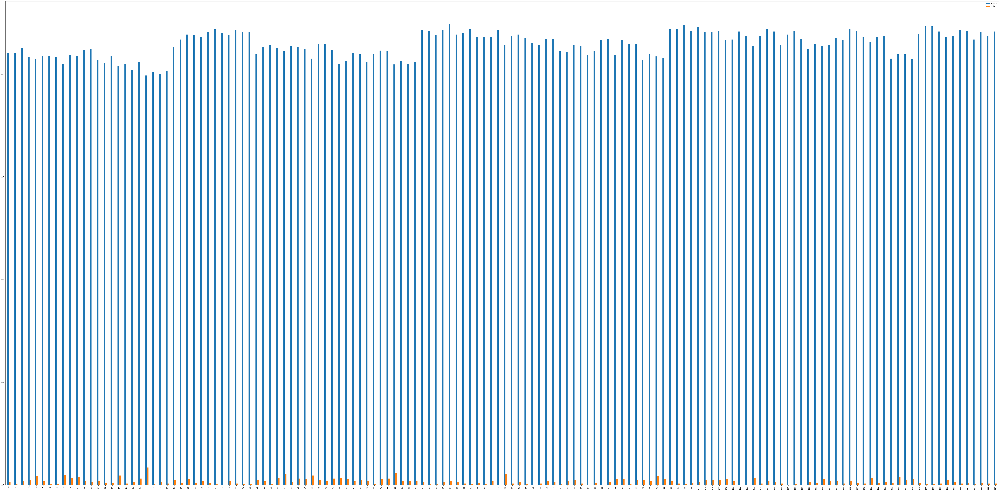

In [1130]:
df_linear = pd.DataFrame(data=data_entropy)
df_linear.plot.bar()

In [1131]:
data_gini

[{'means': 0.8361823361823362,
  'stds': 0.007122507122507116,
  'params': {'criterion': 'gini',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 10}},
 {'means': 0.8632478632478633,
  'stds': 0.01709401709401709,
  'params': {'criterion': 'gini',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 30}},
 {'means': 0.829059829059829,
  'stds': 0.005698005698005658,
  'params': {'criterion': 'gini',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 50}},
 {'means': 0.8504273504273504,
  'stds': 0.024216524216524205,
  'params': {'criterion': 'gini',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 1,
   'n_estimators': 100}},
 {'means': 0.8262108262108262,
  'stds': 0.005698005698005715,
  'params': {'criterion': 'gini',
   'max_depth': 4,
   'max_features': 'auto',
   'min_samples_leaf': 2,
   'n_estimators': 10}},
 {'means': 0.8490028490028491,


<AxesSubplot:>

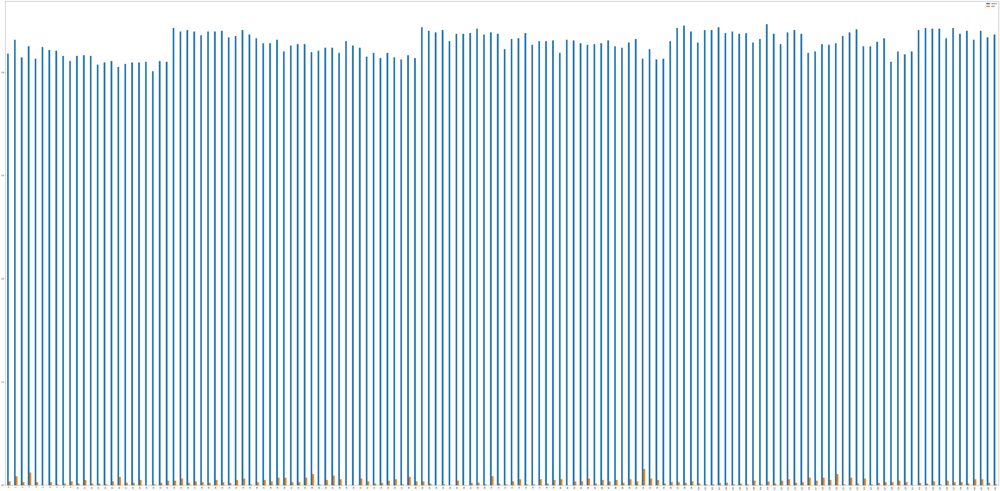

In [1132]:
df_linear = pd.DataFrame(data=data_gini)
df_linear.plot.bar()